### Imports 

In [1]:
import pandas as pd 
import json
from typing import List
from os import listdir
import spotipy
import spotipy.util as util
import plotly.express as px
import plotly.io as pio
from spotipy.oauth2 import SpotifyClientCredentials

### Getting the Data

To retrieve my Spotify data, I navigated to the privacy settings on Spotify's website at https://www.spotify.com/. I initiated the data request process, and it took approximately 15 days for me to receive a zip file containing my data via email.

In [2]:
def get_streamings(path: str = 'MyData') -> List[dict]:
    """
    Retrieves Spotify streaming history from the specified directory.

    Parameters:
        path (str): The directory path where Spotify streaming history data files are located.

    Returns:
        List[dict]: A list of dictionaries containing streaming history data.
    """

    # List all files in the specified directory with the correct naming scheme
    files = [f'{path}/{x}' for x in listdir(path) if x.startswith('Streaming_History_Audio_')]

    all_streamings = []

    for file in files:
        # Open and read the file's content
        with open(file, 'r', encoding='UTF-8') as f:
            # Load JSON content from the file
            new_streamings = json.load(f)
            all_streamings += new_streamings

    return all_streamings

# dir path in my machine
spotify_data_directory = '/Users/adrianrodriguez/Downloads/MyData 3/'

# Call the function to retrieve streaming history data
streaming_data = get_streamings(spotify_data_directory)


Converted 'streaming_data' into DataFrame and used the 'ts' (timestamp) column to create 'year' and 'month' columns.


In [3]:
# Loads streaming data into a Pandas DataFrame
streaming_data = pd.DataFrame(streaming_data)

# Converts the 'ts' (timestamp) column to a datetime format
streaming_data['ts'] = pd.to_datetime(streaming_data['ts'])

# Creates a new column 'year' to extract and store the year from the 'ts' column
streaming_data['year'] = streaming_data['ts'].dt.year

# Creates a new column 'month' to extract and store the month as a string
# using the strftime method to format it to the full month name
streaming_data['month'] = streaming_data['ts'].dt.strftime('%B')

# Creates DataFrame
streaming_data = pd.DataFrame(streaming_data)

# Drop the unwanted columns
streaming_data.drop(columns=['ip_addr_decrypted', 'username'], inplace=True)

# Displays the updated DataFrame with the new 'year' and 'month' columns and removed the'ip_addr_decrypted' and 'username' columns
streaming_data



,ts,platform,ms_played,conn_country,user_agent_decrypted,master_metadata_track_name,master_metadata_album_artist_name,master_metadata_album_album_name,spotify_track_uri,episode_name,...,spotify_episode_uri,reason_start,reason_end,shuffle,skipped,offline,offline_timestamp,incognito_mode,year,month
0,2020-02-04 01:52:32+00:00,"iOS 13.3 (iPhone11,8)",173493,US,unknown,Fluorescent Adolescent,Arctic Monkeys,Favourite Worst Nightmare,spotify:track:7e8utCy2JlSB8dRHKi49xM,None,...,None,trackdone,trackdone,False,None,False,1580780950371,False,2020,February
1,2020-02-04 01:55:37+00:00,"iOS 13.3 (iPhone11,8)",181480,US,unknown,Only Ones Who Know,Arctic Monkeys,Favourite Worst Nightmare,spotify:track:7ABWRukVQcXrIrDKDx5Gek,None,...,None,trackdone,trackdone,False,None,False,1580781151579,False,2020,February
2,2020-02-04 01:59:02+00:00,"iOS 13.3 (iPhone11,8)",205240,US,unknown,Do Me a Favour,Arctic Monkeys,Favourite Worst Nightmare,spotify:track:13NCxLOlvQ4Tnexgfp03Gs,None,...,None,trackdone,trackdone,False,None,False,1580781336302,False,2020,February
3,2020-02-04 02:02:13+00:00,"iOS 13.3 (iPhone11,8)",189680,US,unknown,This House Is a Circus,Arctic Monkeys,Favourite Worst Nightmare,spotify:track:7gPd55hW5pVjTm3H9S1Wbv,None,...,None,trackdone,trackdone,False,None,False,1580781541563,False,2020,February
4,2020-02-04 02:06:56+00:00,"iOS 13.3 (iPhone11,8)",274200,US,unknown,"If You Were There, Beware",Arctic Monkeys,Favourite Worst Nightmare,spotify:track:0ZUXj43fteJjwvGoLMntte,None,...,None,trackdone,trackdone,False,None,False,1580781732882,False,2020,February
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299339,2018-04-18 21:14:55+00:00,"iOS 11.3 (iPhone8,2)",2600,US,unknown,Rubber & Bone,The Growlers,City Club,spotify:track:4WmkSPSFkXMpWrzPJOiz1H,None,...,None,fwdbtn,fwdbtn,False,None,False,1524086048070,False,2018,April
299340,2018-04-18 22:03:44+00:00,"iOS 11.3 (iPhone8,2)",140341,US,unknown,The Daisy Chain,The Growlers,City Club,spotify:track:2iCzZEPF8GTfQ1v4WCi7De,None,...,None,fwdbtn,fwdbtn,False,None,False,1524086050672,False,2018,April
299341,2018-04-18 22:03:56+00:00,"iOS 11.3 (iPhone8,2)",3436,US,unknown,World Unglued,The Growlers,City Club,spotify:track:3UL1VvlrSYjTKbpgGAyyUx,None,...,None,fwdbtn,fwdbtn,False,None,False,1524089023164,False,2018,April
299342,2018-04-18 22:06:38+00:00,"iOS 11.3 (iPhone8,2)",69022,US,unknown,Neverending Line,The Growlers,City Club,spotify:track:63KqjQQ4ofFpQkmPXKTyEX,None,...,None,fwdbtn,fwdbtn,False,None,False,1524089026622,False,2018,April


### Data Cleaning: streaming_data:

'streaming_data' offers an extensive log of each individual streaming session, including session durations initially measured in milliseconds. To enhance clarity, these durations will be converted into minutes.

In [4]:
# Calculates and adds a new column "minutes_played" by converting "ms_played" from milliseconds to minutes
streaming_data['minutes_played'] = streaming_data['ms_played'] / (1000 * 60)

# Prints the updated DataFrame, which includes the original "ms_played" and the newly calculated "minutes_played"
print(streaming_data[['ms_played', 'minutes_played']])


        ms_played  minutes_played
0          173493        2.891550
1          181480        3.024667
2          205240        3.420667
3          189680        3.161333
4          274200        4.570000
...           ...             ...
299339       2600        0.043333
299340     140341        2.339017
299341       3436        0.057267
299342      69022        1.150367
299343     138251        2.304183

[299344 rows x 2 columns]


In [5]:
# Sorts the DataFrame from greatest to lowest based on 'minutes_played'
streaming_data_sorted = streaming_data.sort_values(by='minutes_played', ascending=False)

# Displays the sorted DataFrame
streaming_data_sorted


,ts,platform,ms_played,conn_country,user_agent_decrypted,master_metadata_track_name,master_metadata_album_artist_name,master_metadata_album_album_name,spotify_track_uri,episode_name,...,reason_start,reason_end,shuffle,skipped,offline,offline_timestamp,incognito_mode,year,month,minutes_played
221049,2020-11-23 19:24:48+00:00,"iOS 14.2 (iPad8,11)",7159062,US,unknown,White Noise 3 Hour Long,Erik Eriksson,White Noise 3 Hour Long,spotify:track:04boE4u1AupbrGlI62WvoO,None,...,clickrow,endplay,False,None,False,1606146689284,False,2020,November,119.317700
220978,2020-11-22 03:18:29+00:00,"iOS 14.1 (iPad8,11)",6184681,US,unknown,White Noise 3 Hour Long,Erik Eriksson,White Noise 3 Hour Long,spotify:track:04boE4u1AupbrGlI62WvoO,None,...,clickrow,endplay,False,None,False,1606006909553,False,2020,November,103.078017
221034,2020-11-22 23:29:30+00:00,"iOS 14.1 (iPad8,11)",6072621,US,unknown,White Noise 2 Hour Long,Erik Eriksson,White Noise 2 Hour Long,spotify:track:58rZguDooZnZmNchpIujnf,None,...,fwdbtn,endplay,False,None,False,1606017974228,False,2020,November,101.210350
221044,2020-11-23 02:18:04+00:00,"iOS 14.1 (iPad8,11)",6060199,US,unknown,White Noise 3 Hour Long,Erik Eriksson,White Noise 3 Hour Long,spotify:track:04boE4u1AupbrGlI62WvoO,None,...,clickrow,endplay,False,None,False,1606090202351,False,2020,November,101.003317
123747,2023-01-20 19:15:18+00:00,ios,5817666,US,unknown,None,None,None,None,Gryffindor Common Room Sound Machine (12 Hours),...,clickrow,unexpected-exit-while-paused,False,False,False,1674236287,False,2023,January,96.961100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15312,2020-05-11 04:44:46+00:00,"iOS 13.3.1 (iPhone11,8)",0,US,unknown,I Think I Smell A Rat,The White Stripes,White Blood Cells,spotify:track:50o9gFkzJLXSQvSAeAmehv,None,...,fwdbtn,fwdbtn,False,None,False,1589172284792,False,2020,May,0.000000
281867,2022-07-06 00:59:35+00:00,"iOS 15.3.1 (iPhone11,8)",0,US,unknown,Pretend I'm Gay,The Growlers,Gilded Pleasures,spotify:track:7eol1PkEpR61IjfCN9SmWh,None,...,clickrow,endplay,False,None,False,1657069174837,False,2022,July,0.000000
32010,2021-06-16 01:20:50+00:00,"iOS 14.6 (iPhone11,8)",0,US,unknown,delicate creature,iogi,the ceiling,spotify:track:7BAk4jJtHKJuo4H05dKSM1,None,...,clickrow,unexpected-exit,False,None,False,1623806448838,False,2021,June,0.000000
168567,2019-06-25 01:06:45+00:00,"iOS 12.3.1 (iPhone11,8)",0,US,unknown,I'm In The Band,The Hellacopters,Rock & Roll Is Dead,spotify:track:3YQHwjPClorNBvKmbJDflL,None,...,fwdbtn,fwdbtn,False,None,False,1561424804347,False,2019,June,0.000000


### Most Played Tracks:

When sorted in descending order, the tracks with the highest 'minutes_played' values include 'White Noise 3 Hour Long.' It's essential to focus on actual songs and exclude sound machines.

Filtering out tracks with durations exceeding 20 minutes is crucial in limiting the analysis to songs. This approach helps identify the songs that were listened to the most.

In [6]:
import pandas as pd

# Creates a new DataFrame, songs_df, by filtering rows where the song duration are 20 minutes or less.
# This helps narrow down the analysis to shorter songs for further examination.

songs_df = streaming_data[streaming_data['minutes_played'] <= 20]

# Print the updated DataFrame
songs_df

,ts,platform,ms_played,conn_country,user_agent_decrypted,master_metadata_track_name,master_metadata_album_artist_name,master_metadata_album_album_name,spotify_track_uri,episode_name,...,reason_start,reason_end,shuffle,skipped,offline,offline_timestamp,incognito_mode,year,month,minutes_played
0,2020-02-04 01:52:32+00:00,"iOS 13.3 (iPhone11,8)",173493,US,unknown,Fluorescent Adolescent,Arctic Monkeys,Favourite Worst Nightmare,spotify:track:7e8utCy2JlSB8dRHKi49xM,None,...,trackdone,trackdone,False,None,False,1580780950371,False,2020,February,2.891550
1,2020-02-04 01:55:37+00:00,"iOS 13.3 (iPhone11,8)",181480,US,unknown,Only Ones Who Know,Arctic Monkeys,Favourite Worst Nightmare,spotify:track:7ABWRukVQcXrIrDKDx5Gek,None,...,trackdone,trackdone,False,None,False,1580781151579,False,2020,February,3.024667
2,2020-02-04 01:59:02+00:00,"iOS 13.3 (iPhone11,8)",205240,US,unknown,Do Me a Favour,Arctic Monkeys,Favourite Worst Nightmare,spotify:track:13NCxLOlvQ4Tnexgfp03Gs,None,...,trackdone,trackdone,False,None,False,1580781336302,False,2020,February,3.420667
3,2020-02-04 02:02:13+00:00,"iOS 13.3 (iPhone11,8)",189680,US,unknown,This House Is a Circus,Arctic Monkeys,Favourite Worst Nightmare,spotify:track:7gPd55hW5pVjTm3H9S1Wbv,None,...,trackdone,trackdone,False,None,False,1580781541563,False,2020,February,3.161333
4,2020-02-04 02:06:56+00:00,"iOS 13.3 (iPhone11,8)",274200,US,unknown,"If You Were There, Beware",Arctic Monkeys,Favourite Worst Nightmare,spotify:track:0ZUXj43fteJjwvGoLMntte,None,...,trackdone,trackdone,False,None,False,1580781732882,False,2020,February,4.570000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299339,2018-04-18 21:14:55+00:00,"iOS 11.3 (iPhone8,2)",2600,US,unknown,Rubber & Bone,The Growlers,City Club,spotify:track:4WmkSPSFkXMpWrzPJOiz1H,None,...,fwdbtn,fwdbtn,False,None,False,1524086048070,False,2018,April,0.043333
299340,2018-04-18 22:03:44+00:00,"iOS 11.3 (iPhone8,2)",140341,US,unknown,The Daisy Chain,The Growlers,City Club,spotify:track:2iCzZEPF8GTfQ1v4WCi7De,None,...,fwdbtn,fwdbtn,False,None,False,1524086050672,False,2018,April,2.339017
299341,2018-04-18 22:03:56+00:00,"iOS 11.3 (iPhone8,2)",3436,US,unknown,World Unglued,The Growlers,City Club,spotify:track:3UL1VvlrSYjTKbpgGAyyUx,None,...,fwdbtn,fwdbtn,False,None,False,1524089023164,False,2018,April,0.057267
299342,2018-04-18 22:06:38+00:00,"iOS 11.3 (iPhone8,2)",69022,US,unknown,Neverending Line,The Growlers,City Club,spotify:track:63KqjQQ4ofFpQkmPXKTyEX,None,...,fwdbtn,fwdbtn,False,None,False,1524089026622,False,2018,April,1.150367


### Data Aggregation:

Summarizes the cumulative minutes played for individual songs while preserving the initial data set for each column group and adding a 'month' and 'year' column.

In [7]:
import pandas as pd

# Removed rows where 'master_metadata_track_name' was equal to 'None'
songs_df = songs_df[songs_df['master_metadata_track_name'] != 'None']

# Grouped the data by 'master_metadata_track_name' and calculated the sum of 'minutes_played'
grouped_df = songs_df.groupby('master_metadata_track_name').agg({
    'minutes_played': 'sum',  # Sum of minutes_played
    'ts': 'count',  # Count of rows (number of plays)
    'platform': 'first',  # Kept the first platform in the group
    'conn_country': 'first',  # Kept the first conn_country in the group
    'user_agent_decrypted': 'first',  # Kept the first user_agent_decrypted in the group
    'master_metadata_album_artist_name': 'first',  # Kept the first artist name in the group
    'master_metadata_album_album_name': 'first',  # Kept the first album name in the group
    'spotify_track_uri': 'first',  # Kept the first track URI in the group
}).reset_index()

# Sorted the grouped DataFrame by 'minutes_played' in descending order
songs_grouped_df = grouped_df.sort_values(by='minutes_played', ascending=False)

# Convert 'ts' column to datetime format
songs_grouped_df['ts'] = pd.to_datetime(streaming_data['ts'])

# Create 'year' column
songs_grouped_df['year'] = streaming_data['ts'].dt.year

# Create 'month' column using strftime
songs_grouped_df['month'] = streaming_data['ts'].dt.strftime('%B')

# Display the updated DataFrame
songs_grouped_df


,master_metadata_track_name,minutes_played,ts,platform,conn_country,user_agent_decrypted,master_metadata_album_artist_name,master_metadata_album_album_name,spotify_track_uri,year,month
24773,Star Treatment,1483.573367,2021-04-29 22:44:32+00:00,"iOS 13.3 (iPhone11,8)",US,unknown,Arctic Monkeys,Tranquility Base Hotel & Casino,spotify:track:0FgNSsaSZTvbLXUumSO8LQ,2021,April
12651,I'll Come Too,1482.494117,2020-04-25 06:15:19+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,James Blake,Assume Form,spotify:track:6EvUAsfncetT0RcWshHCbl,2020,April
24281,Someday,1176.526867,2021-04-27 21:53:35+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,The Growlers,Hung At Heart,spotify:track:6eJobiVXF5HQN48BX4spZs,2021,April
2589,Batphone,963.282333,2020-02-28 22:30:08+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,Arctic Monkeys,Tranquility Base Hotel & Casino,spotify:track:7seSDB6TiLZarbicyDIjiQ,2020,February
14947,Leave It In My Dreams,949.748350,2020-05-08 22:30:26+00:00,"iOS 13.3 (iPhone11,8)",US,unknown,The Voidz,Virtue,spotify:track:31u6rUeIEXGrYVoh10U7eu,2020,May
...,...,...,...,...,...,...,...,...,...,...,...
4637,Changing,0.000000,2020-03-10 03:14:01+00:00,"iOS 14.6 (iPhone11,8)",US,unknown,The Airborne Toxic Event,All At Once,spotify:track:6M23RkYPbVR91c4iWVNkcl,2020,March
12638,I'll Be Somewhere,0.000000,2020-04-25 06:07:40+00:00,ios,US,unknown,The Happy Fits,Under The Shade of Green,spotify:track:3xmQXf4bUbXzTrVb5eQndB,2020,April
1168,All About That Bass,0.000000,2020-02-14 22:55:42+00:00,"iOS 14.6 (iPhone11,8)",US,unknown,Meghan Trainor,Title,spotify:track:5jE48hhRu8E6zBDPRSkEq7,2020,February
27736,Three Times A Lady,0.000000,2021-05-24 17:42:59+00:00,ios,US,unknown,Commodores,Natural High,spotify:track:2uTGX4wxnRGS3i0FSOMGCQ,2021,May


### Top Songs Played:

In [8]:
# Rank the rows based on the 'count' column
songs_grouped_df['rank'] = songs_grouped_df['minutes_played'].rank(ascending=False, method='min')

# Reorder columns to make 'rank' the first column
column_order = ['rank'] + [col for col in songs_grouped_df.columns if col != 'rank']
songs_grouped_df = songs_grouped_df[column_order]

# Sort the DataFrame based on the rank
songs_grouped_df = songs_grouped_df.sort_values(by='rank')
songs_grouped_df

,rank,master_metadata_track_name,minutes_played,ts,platform,conn_country,user_agent_decrypted,master_metadata_album_artist_name,master_metadata_album_album_name,spotify_track_uri,year,month
24773,1.0,Star Treatment,1483.573367,2021-04-29 22:44:32+00:00,"iOS 13.3 (iPhone11,8)",US,unknown,Arctic Monkeys,Tranquility Base Hotel & Casino,spotify:track:0FgNSsaSZTvbLXUumSO8LQ,2021,April
12651,2.0,I'll Come Too,1482.494117,2020-04-25 06:15:19+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,James Blake,Assume Form,spotify:track:6EvUAsfncetT0RcWshHCbl,2020,April
24281,3.0,Someday,1176.526867,2021-04-27 21:53:35+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,The Growlers,Hung At Heart,spotify:track:6eJobiVXF5HQN48BX4spZs,2021,April
2589,4.0,Batphone,963.282333,2020-02-28 22:30:08+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,Arctic Monkeys,Tranquility Base Hotel & Casino,spotify:track:7seSDB6TiLZarbicyDIjiQ,2020,February
14947,5.0,Leave It In My Dreams,949.748350,2020-05-08 22:30:26+00:00,"iOS 13.3 (iPhone11,8)",US,unknown,The Voidz,Virtue,spotify:track:31u6rUeIEXGrYVoh10U7eu,2020,May
...,...,...,...,...,...,...,...,...,...,...,...,...
5217,31395.0,Come Sail Away,0.000000,2020-03-12 15:38:43+00:00,"iOS 14.8.1 (iPhone11,8)",US,unknown,Styx,The Grand Illusion,spotify:track:0PsbWiVtix5FoTZ1s00mEl,2020,March
13951,31395.0,"Joseph, Better You Than Me",0.000000,2020-05-01 16:58:56+00:00,OS X 10.12.5 [x86 8],US,unknown,The Killers,"Joseph, Better You Than Me",spotify:track:1RlOygxSaMaOeIb3Di4cpm,2020,May
6896,31395.0,Don't Carry It All,0.000000,2020-03-21 23:45:46+00:00,"iOS 14.6 (iPhone11,8)",US,unknown,The Decemberists,The King Is Dead,spotify:track:2UODQhPzz51lssoMPOlfy5,2020,March
25593,31395.0,Swamp Fruit,0.000000,2021-05-03 18:01:40+00:00,"iOS 12.3.1 (iPhone11,8)",US,unknown,Post Animal,Post Animal Perform the Most Curious Water Act...,spotify:track:4yyvIYex9wTsGJsxuYdBUB,2021,May


# Vizualizations:

### Streams Over Time

In [9]:
pio.renderers.default = 'notebook'

# Assuming your DataFrame is named streaming_data
# Convert the 'ts' column to a datetime object
streaming_data['ts'] = pd.to_datetime(streaming_data['ts'])

# Group the data by 'ts' and sum the 'minutes_played' for each timestamp
streams_over_time = streaming_data.groupby('ts')['minutes_played'].sum().reset_index()

# Create an interactive line plot for streams over time with Plotly
fig = px.line(streams_over_time, x='ts', y='minutes_played', title='Streams Over Time')
fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Streams')

# Enable zooming and panning
fig.update_xaxes(rangeslider_visible=True)

# Show the plot
fig.show()


<img src="images/Streams Over Time.png" alt="Audio Features Correlation Heat Map" style="width: 1000px;"/>

### Top Played Songs 

In [10]:
# Assuming songs_grouped_df is your actual DataFrame with the columns mentioned
# Sort the DataFrame by 'minutes_played' to get the most played songs and limit to top 10
top_songs = songs_grouped_df.sort_values('minutes_played', ascending=False).head(10)

# Create the bar chart using Plotly Express
fig = px.bar(top_songs,
             x='master_metadata_track_name', 
             y='minutes_played',
             text='master_metadata_album_artist_name',
             title='Top 10 Most Played Songs')

# Customize the layout to include the artist names in the bar chart
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide',
                  xaxis_title='Song Name',
                  yaxis_title='Minutes Played')

# Show the figure
fig.show()

<img src="images/Top 10 Most Played Songs.png" alt="Audio Features Correlation Heat Map" style="width: 1000px;"/>

### Showing Plot Between 'rank' and 'minutes_played'

In [11]:
# Creates an interactive scatter plot between 'rank' and 'minutes_played' using Plotly
fig = px.scatter(
    songs_grouped_df,
    x='rank',
    y='minutes_played',
    title='Scatter Plot: Rank vs. Minutes Played',
    hover_name='master_metadata_track_name',  # Track name shown on hover
    hover_data=['master_metadata_album_artist_name'],  # Artist name shown on hover
)

fig.update_xaxes(title_text='Rank')
fig.update_yaxes(title_text='Minutes Played')

# Enable zooming and panning
fig.update_xaxes(type='linear')
fig.update_yaxes(type='linear')

# Show the plot
fig.show()


<img src="images/Scatter Plot Rank Vs. Minutes Played.png" alt="Scatter Plot Rank Vs. Minutes Played" style="width: 1000px;"/>

### Accessing Spotify API

In [12]:
username = 'juliorod323'
client_id ='3d2dd78837114f7ab9c5bb16c14ee9ba'
client_secret = '706144568b26419d90d293a14904396b'
redirect_uri = 'http://localhost:7777/callback'
scope = 'user-read-recently-played'

token = util.prompt_for_user_token(username=username, 
                                   scope=scope, 
                                   client_id=client_id,   
                                   client_secret=client_secret,     
                                   redirect_uri=redirect_uri)


In [13]:

import requests

def get_id(track_name: str, token: str) -> str:
    headers = {
        'Accept': 'application/json',
        'Content-Type': 'application/json',
        'Authorization': f'Bearer {token}',
    }
    params = {
        'q': track_name,
        'type': 'track',
    }
    try:
        response = requests.get('https://api.spotify.com/v1/search', headers=headers, params=params, timeout=5)
        data = response.json()
        first_result = data['tracks']['items'][0]
        track_id = first_result['id']
        return track_id
    except:
        return None

In [14]:
# Create a Spotify API client
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

def get_features(track_id: str, token: str) -> dict:
    """
    Get Spotify track audio features.

    Args:
        track_id (str): The Spotify track ID.
        token (str): Your Spotify access token.

    Returns:
        dict: Dictionary containing track audio features.
    """
    try:
        features = sp.audio_features(track_id)
        return features[0] if features else None
    except:
        return None


In [15]:
songs_grouped_df.columns

Index(['rank', 'master_metadata_track_name', 'minutes_played', 'ts',
       'platform', 'conn_country', 'user_agent_decrypted',
       'master_metadata_album_artist_name', 'master_metadata_album_album_name',
       'spotify_track_uri', 'year', 'month'],
      dtype='object')

### API Obstacles 

I have run into request limitation with the Spotify API, so as a precaution, I will create the top_song_100 df that contains the top 100 most played songs. I want to see the attributes for my top 100 songs played.

In [16]:
# Creates a condensed version of the songs_grouped_df DataFrame
top_songs_100 = songs_grouped_df.sort_values('minutes_played', ascending=False).head(100)
top_songs_100

,rank,master_metadata_track_name,minutes_played,ts,platform,conn_country,user_agent_decrypted,master_metadata_album_artist_name,master_metadata_album_album_name,spotify_track_uri,year,month
24773,1.0,Star Treatment,1483.573367,2021-04-29 22:44:32+00:00,"iOS 13.3 (iPhone11,8)",US,unknown,Arctic Monkeys,Tranquility Base Hotel & Casino,spotify:track:0FgNSsaSZTvbLXUumSO8LQ,2021,April
12651,2.0,I'll Come Too,1482.494117,2020-04-25 06:15:19+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,James Blake,Assume Form,spotify:track:6EvUAsfncetT0RcWshHCbl,2020,April
24281,3.0,Someday,1176.526867,2021-04-27 21:53:35+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,The Growlers,Hung At Heart,spotify:track:6eJobiVXF5HQN48BX4spZs,2021,April
2589,4.0,Batphone,963.282333,2020-02-28 22:30:08+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,Arctic Monkeys,Tranquility Base Hotel & Casino,spotify:track:7seSDB6TiLZarbicyDIjiQ,2020,February
14947,5.0,Leave It In My Dreams,949.748350,2020-05-08 22:30:26+00:00,"iOS 13.3 (iPhone11,8)",US,unknown,The Voidz,Virtue,spotify:track:31u6rUeIEXGrYVoh10U7eu,2020,May
...,...,...,...,...,...,...,...,...,...,...,...,...
28359,96.0,Trouble,364.247700,2021-05-31 00:16:11+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,Cage The Elephant,Tell Me I'm Pretty,spotify:track:5n0CTysih20NYdT2S0Wpe8,2021,May
10079,97.0,Going Gets Tough,362.715700,2020-04-09 02:04:29+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,The Growlers,Chinese Fountain,spotify:track:0dEhydwCE5Og4PLKyjfqMR,2020,April
3762,98.0,British Bombs,362.609383,2020-03-05 23:58:30+00:00,OS X 10.14.6 [x86 8],US,unknown,Declan McKenna,British Bombs,spotify:track:4ZdmTNaBTErD8n9AQE0YaX,2020,March
30484,99.0,Why'd You Only Call Me When You're High?,359.919717,2021-06-10 00:38:03+00:00,"iOS 13.3.1 (iPhone11,8)",US,unknown,Arctic Monkeys,AM,spotify:track:086myS9r57YsLbJpU0TgK9,2021,June


In [17]:
import pandas as pd

# Defines a list to store the audio features for each track
audio_features_list = []

# Loops through the 'master_metadata_track_name' column
for track_name in top_songs_100['master_metadata_track_name']:
    # Get the Spotify track ID for the current track
    track_id = get_id(track_name, token)
    
    # If a track ID is found, retrieves audio features
    if track_id:
        track_features = get_features(track_id, token)
        
        # If audio features are found, add them to the list
        if track_features:
            audio_features_list.append(track_features)

# Creates a DataFrame from the list of audio features
audio_features_df = pd.DataFrame(audio_features_list)

# Displays the resulting DataFrame with audio features
print(audio_features_df)


    danceability  energy  key  loudness  mode  speechiness  acousticness  \
0          0.581   0.767    7    -5.026     0       0.0527       0.24300   
1          0.661   0.472    7    -7.889     1       0.1640       0.75700   
2          0.539   0.521    9    -7.460     1       0.0299       0.00425   
3          0.675   0.681    5    -5.728     0       0.0356       0.31200   
4          0.600   0.746    4    -4.696     0       0.0355       0.02260   
..           ...     ...  ...       ...   ...          ...           ...   
95         0.470   0.623    0    -5.655     1       0.0302       0.39200   
96         0.501   0.769    8    -6.257     1       0.0326       0.22500   
97         0.674   0.865    6    -6.167     1       0.0412       0.04620   
98         0.691   0.631    2    -6.478     1       0.0368       0.04830   
99         0.457   0.551    5    -9.360     0       0.1670       0.42700   

    instrumentalness  liveness  valence    tempo            type  \
0           0.00131

### Limiting "Features" in Analysis:

In [18]:
# Columns to drop
columns_to_drop = ['mode', 'valence', 'analysis_url', 'time_signature', 'uri', 'track_href', 'id', 'type','key']

# Drop the specified columns from the DataFrame, ignoring columns that do not exist
audio_features_df = audio_features_df.drop(columns=columns_to_drop, errors='ignore')

# Display the resulting DataFrame
print(audio_features_df)


    danceability  energy  loudness  speechiness  acousticness  \
0          0.581   0.767    -5.026       0.0527       0.24300   
1          0.661   0.472    -7.889       0.1640       0.75700   
2          0.539   0.521    -7.460       0.0299       0.00425   
3          0.675   0.681    -5.728       0.0356       0.31200   
4          0.600   0.746    -4.696       0.0355       0.02260   
..           ...     ...       ...          ...           ...   
95         0.470   0.623    -5.655       0.0302       0.39200   
96         0.501   0.769    -6.257       0.0326       0.22500   
97         0.674   0.865    -6.167       0.0412       0.04620   
98         0.691   0.631    -6.478       0.0368       0.04830   
99         0.457   0.551    -9.360       0.1670       0.42700   

    instrumentalness  liveness    tempo  duration_ms  
0           0.001310    0.1410  120.070       354640  
1           0.002750    0.1920   73.986       222400  
2           0.000000    0.3670  106.035       183440  

In [19]:
audio_features_df.columns

Index(['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'tempo', 'duration_ms'],
      dtype='object')

### Pair Plot

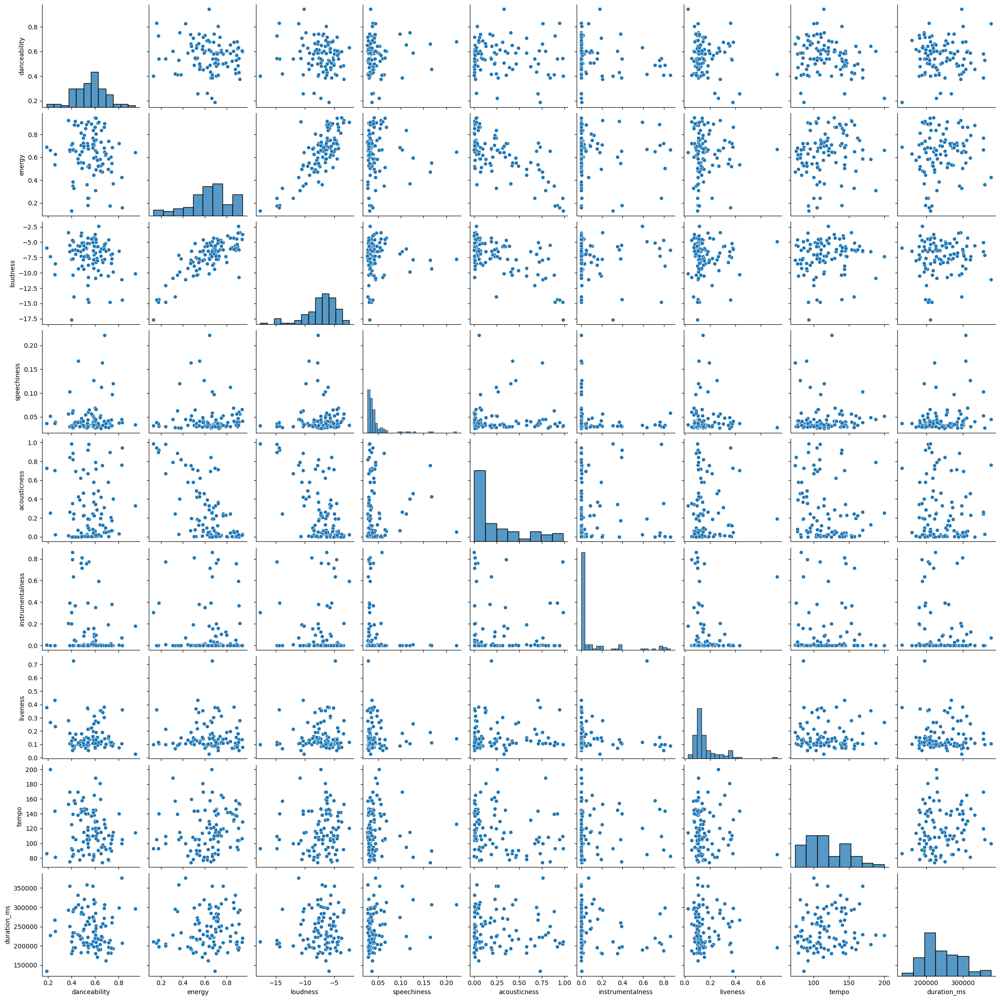

In [20]:
import seaborn as sns
sns.pairplot(audio_features_df)


<img src="images/Audio Features Pairplot.png" alt="images/Audio Features Pairplot" style="width: 1000px;"/> 

### Spotify Track "Features" Plotted Along Frequency 

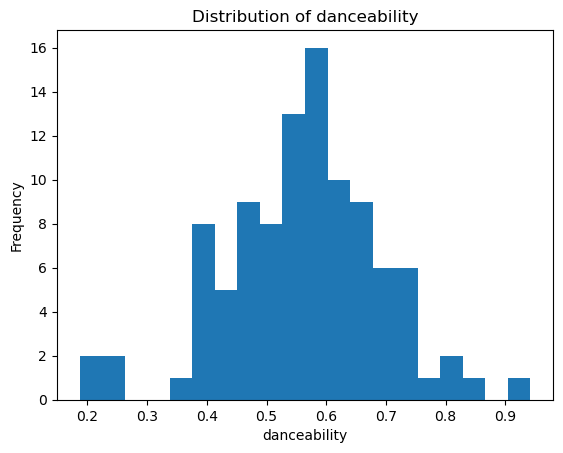

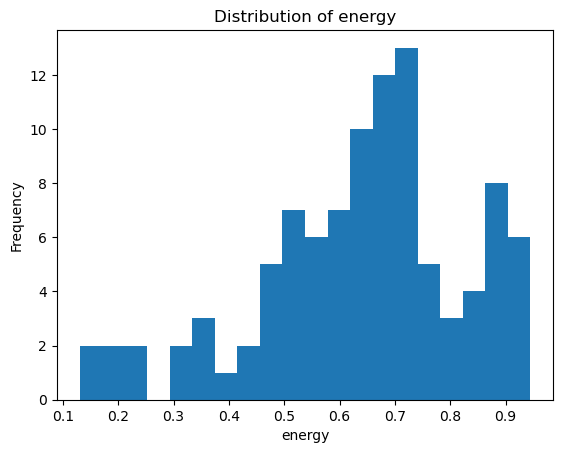

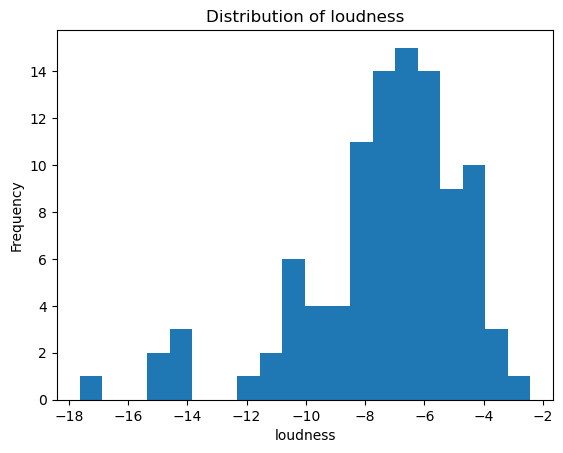

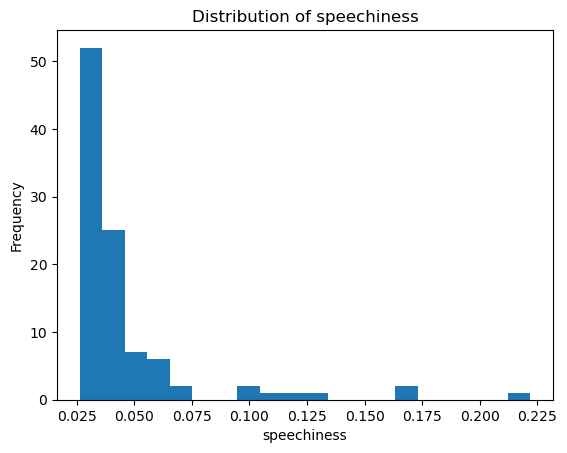

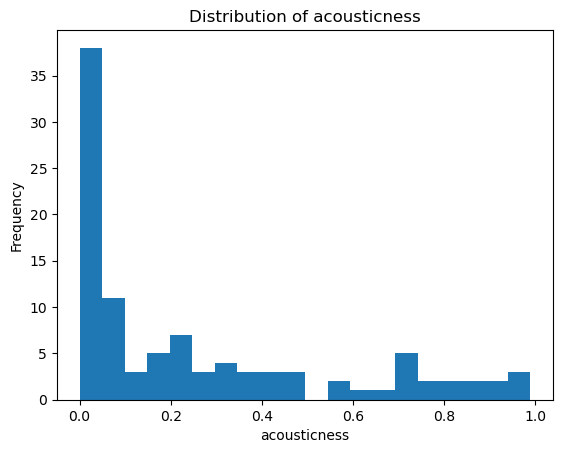

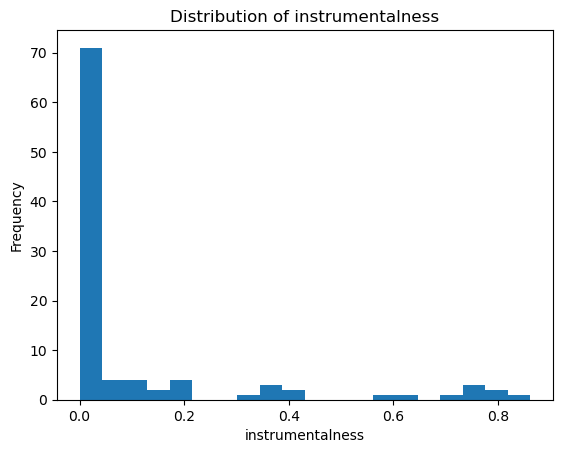

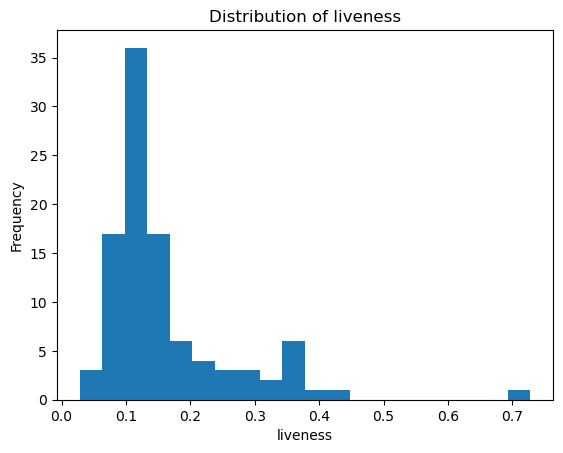

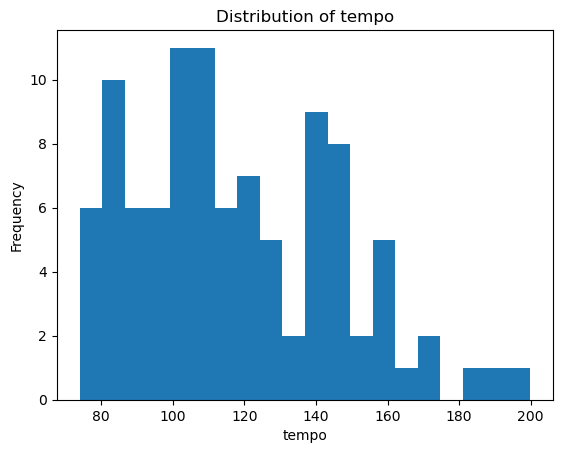

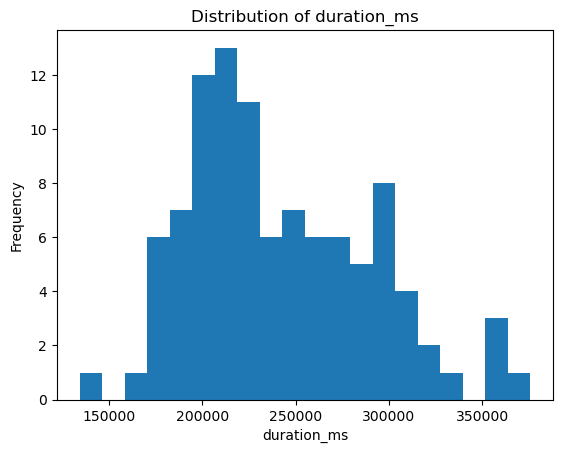

In [21]:
import matplotlib.pyplot as plt
for feature in audio_features_df.columns:
    plt.hist(audio_features_df[feature], bins=20)
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {feature}')
    plt.show()


### Coorelation Heatmap:

Text(0.5, 1.0, 'Correlation Heatmap of Audio Features')

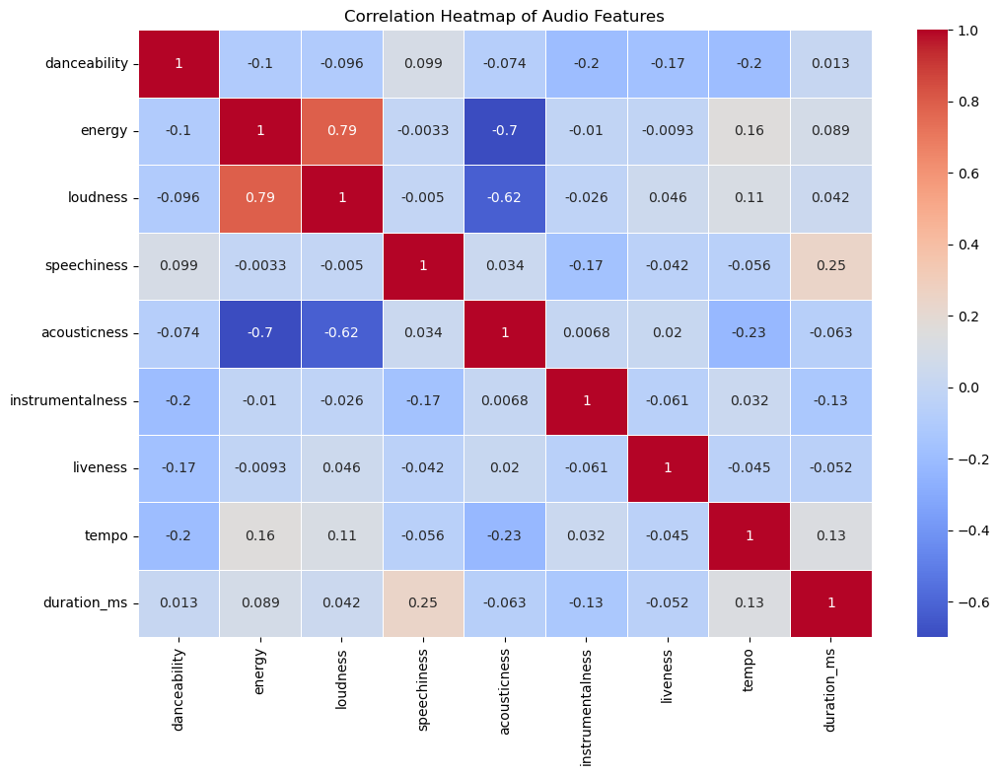

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
corr_matrix = audio_features_df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap of Audio Features')


<img src="images/Audio Features Correlation Heat Map.png" alt="Audio Features Correlation Heat Map" style="width: 1000px;"/>
